In [34]:
import os
os.environ['PYOPENGL_PLATFORM'] = 'egl'
import pyrender
from zipfile import ZipFile
import json
import numpy as np
import torch
from pspy import Part
import meshplot as mp
import trimesh
from matplotlib import pyplot as plt
import scipy

In [35]:
with open('/projects/grail/benjonesnb/cadlab/siggasia2022/fusion360seg.json','r') as f:
    index = json.load(f)
data =  ZipFile('/projects/grail/benjonesnb/cadlab/siggasia2022/fusion360seg.zip','r')

In [36]:
parts_list = [index['template'].format(*x) for x in index['test']]

In [37]:
part = Part(data.open(parts_list[100]).read().decode('utf-8'))

In [38]:
part.summary.bounding_box

array([[-10.0000001 ,  -6.95652184,  -6.95652184],
       [ 10.0000001 ,   6.95652184,   6.95652184]])

In [39]:
cmap = plt.cm.get_cmap('tab20', lut=(part.mesh_topology.face_to_topology.max() + 1))

In [40]:
(cmap(part.mesh_topology.face_to_topology) * 255).astype(int)

array([[158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [158, 218, 229, 255],
       [199, 199, 199, 255],
       [199, 199, 199, 255],
       [199, 199, 199, 255],
       [199, 199, 199, 255],
       [199, 199, 199, 255],
       [199, 199, 199, 255],
       [199, 199, 199, 255],
       [199, 199, 199, 255],
       [199, 199, 199, 255],
       [199, 1

In [41]:
c_rot = scipy.spatial.transform.Rotation.from_euler('x', 45, degrees=True).as_matrix()

In [42]:
bb.min(axis=0)

NameError: name 'bb' is not defined

In [43]:
def look_at(point, pos, up):
    z = pos - point
    x = np.cross(up, z)
    y = np.cross(z, x)
    x = x / np.linalg.norm(x)
    y = y / np.linalg.norm(y)
    z = z / np.linalg.norm(z)
    pose = np.eye(4)
    pose[:3,0] = x
    pose[:3,1] = y
    pose[:3,2] = z
    pose[:3,3] = pos
    return pose

In [44]:
look_at([0,0,0.], bb.min(axis=0), [0,1,0])

NameError: name 'bb' is not defined

In [352]:
cam.get_projection_matrix().dot(np.concatenate([bb, np.array([[1],[1]])],axis=1).T)

array([[-0.90909091,  0.90909091],
       [-0.19891334,  0.19854869],
       [-0.80090045, -1.20110055],
       [ 1.        ,  1.        ]])

In [344]:
cam.get_projection_matrix()

array([[ 0.09090909,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.09090909,  0.        ,  0.        ],
       [ 0.        ,  0.        , -0.02001001, -1.0010005 ],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

In [359]:
look_at([0,0,0],bb.min(axis=0),[0,1,0])

array([[-10.0000001 , -21.88046788, -10.0000001 , -10.0000001 ],
       [  0.        , 200.000004  ,  -2.18804677,  -2.18804677],
       [ 10.0000001 , -21.88046788, -10.0000001 , -10.0000001 ],
       [  0.        ,   0.        ,   0.        ,   1.        ]])

In [473]:
bb.sum(axis=0)

array([0., 0., 0.])

In [51]:
def find_best_angle(part, cubify=True, normalize=True):
    V = part.mesh.V
    if normalize: # assuming centered part for now
        max_coord = np.abs(V).max()
        scale = 1 / max_coord
        V = V * scale
    bb = np.stack([V.min(axis = 0), V.max(axis=0)])
    #bb = part.summary.bounding_box
    face_labels = np.tile(part.mesh_topology.face_to_topology, (3,1)).T.astype(int)
    mesh = trimesh.Trimesh(vertices=V, faces=part.mesh.F, face_colors=face_labels)
    pmesh = pyrender.Mesh.from_trimesh(mesh, smooth=False)
    r = pyrender.OffscreenRenderer(viewport_width=800, viewport_height=800, point_size=1.0)
    scene = pyrender.Scene(ambient_light=[1.0, 1.0, 1.0], bg_color=[1.0, 1.0, 1.0])
    
    c = bb.sum(axis=0) # bounding box center
    
    if cubify:
        s = np.abs(bb - c).max()
        bb = np.array([
            [c[0]-s,c[1]-s,c[2]-s],
            [c[0]+s,c[1]+s,c[2]+s]
        ])
        
        
    side_positions = [
        [c[0],c[1],bb[0,2]*1.1], # front
        [c[0],c[1],bb[1,2]*1.1], # back
        [bb[0,0]*1.1,c[1],c[2]], # left
        [bb[1,0]*1.1,c[1],c[2]], # right
    ]    
    
    top_corner_positions = [
        [bb[0,0],bb[1,1],bb[0,2]], # front top left
        [bb[1,0],bb[1,1],bb[0,2]], # front top right
        [bb[0,0],bb[1,1],bb[1,2]], # back top left
        [bb[1,0],bb[1,1],bb[1,2]], # back top right
    ]
    
    bottom_corner_positions = [
        [bb[0,0],bb[0,1],bb[0,2]], # front bottom left
        [bb[1,0],bb[0,1],bb[0,2]], # front bottom right   
        [bb[0,0],bb[0,1],bb[1,2]], # back bottom left
        [bb[1,0],bb[0,1],bb[1,2]], # back bottom right
    ]
    
    side_top_position = [
        [c[0],bb[1,1],bb[0,2]*1.1], # front top
        [c[0],bb[1,1],bb[1,2]*1.1], # back top
        [bb[0,0]*1.1,bb[1,1],c[2]], # left top
        [bb[1,0]*1.1,bb[1,1],c[2]], # right top
    ]
    
    side_bottom_position = [
        [c[0],bb[0,1],bb[0,2]*1.1], # front bottom
        [c[0],bb[0,1],bb[1,2]*1.1], # back bottom
        [bb[0,0]*1.1,bb[0,1],c[2]], # left bottom
        [bb[1,0]*1.1,bb[0,1],c[2]], # right bottom
    ]
    
    candidate_positions = top_corner_positions

    if cubify:
        s = np.abs(bb - c).max()
        bb = np.array([
            [c[0]-s,c[1]-s,c[2]-s],
            [c[0]+s,c[1]+s,c[2]+s]
        ])
    
        top_corner_positions = [
            [bb[0,0],bb[1,1],bb[0,2]], # front top left
            [bb[1,0],bb[1,1],bb[0,2]], # front top right
            [bb[0,0],bb[1,1],bb[1,2]], # back top left
            [bb[1,0],bb[1,1],bb[1,2]], # back top right
        ]
        
        candidate_positions += top_corner_positions
    
        
    n_visible_faces = []
    image_areas = []
    candidate_poses = []
    zooms = []
    depths = []
    #candidate_renderings = []
    for pos in candidate_positions:
        camera_pose = look_at(c, pos, [0,1,0])
        candidate_poses.append(camera_pose)
        zoom = 1.2 * np.abs(camera_pose[:3,:3].dot(bb.T)).max()
        zooms.append(zoom)
        cam = pyrender.OrthographicCamera(xmag=zoom, ymag=zoom)
        scene = pyrender.Scene(ambient_light=[1.0, 1.0, 1.0], bg_color=[1.0, 1.0, 1.0])
        scene.add(pmesh, pose=np.eye(4))
        scene.add(cam, pose=camera_pose)
        color, depth = r.render(scene, flags=pyrender.constants.RenderFlags.FLAT | pyrender.constants.RenderFlags.SKIP_CULL_FACES)
        n_visible_faces.append(len(np.unique(color[:,:,0].flatten()[color[:,:,0].flatten() <= face_labels[:,0].max()])))
        image_areas.append((depth > 0).sum())
        depths.append(depth)
        #candidate_renderings.append(color)
    ordering = sorted(enumerate(zip(n_visible_faces, image_areas)), key=lambda x: x[1], reverse=True)
    best_idx = ordering[0][0]
    best_zoom = zooms[best_idx]
    # Rescale to maximize image in frame
    depth = depths[best_idx]
    mask = depth > 0
    mg = np.stack(np.meshgrid(np.linspace(-1,1,800),np.linspace(-1,1,800)),axis=-1)
    zoom_factor = np.abs(mg.reshape((-1,2))[mask.flatten()]).max() * 1.05 # add 5% for some margin
    return candidate_poses[best_idx], zoom_factor * best_zoom

In [46]:
def render_part(
        part, camera_pose, zoom, 
        max_labels = None, face_labels=None, cmap='tab20', 
        renderer = None,viewport_width=800, viewport_height=800, point_size=1.0,
        normalize=True
):
    V = part.mesh.V
    if normalize: # assuming centered part for now
        max_coord = np.abs(V).max()
        scale = 1 / max_coord
        V = V * scale
    if not max_labels:
        max_labels = (part.mesh_topology.face_to_topology.max() + 1)
    palette = plt.cm.get_cmap(cmap, lut=max_labels)
    
    tri_labels = part.mesh_topology.face_to_topology
    
    face_colors = (palette(tri_labels)*255).astype(int)
    
    mesh = trimesh.Trimesh(vertices=V, faces=part.mesh.F, face_colors=face_colors)
    pmesh = pyrender.Mesh.from_trimesh(mesh, smooth=False)
    
    cam = pyrender.OrthographicCamera(xmag=zoom, ymag=zoom)
    
    scene = pyrender.Scene(ambient_light=[1.0, 1.0, 1.0], bg_color=[1.0, 1.0, 1.0])
    scene.add(pmesh, pose=np.eye(4))
    scene.add(cam, pose=camera_pose)
    
    if not renderer:
        r = pyrender.OffscreenRenderer(viewport_width=viewport_width, viewport_height=viewport_height, point_size=point_size)
    
    # Rendering an image with independent face colors. Do this first regardless of overridding
    # color labels in order to compute hard edges for edge rendering
    color, _ = r.render(scene, flags=pyrender.constants.RenderFlags.FLAT | pyrender.constants.RenderFlags.SKIP_CULL_FACES)
    
    # Detect Edges to add to image
    laplace_kernel = np.array([[0, 1, 0],[1, -4, 1],[0, 1, 0]])
    edge_mask = (
        (scipy.ndimage.convolve(color[:,:,0], laplace_kernel) 
         + scipy.ndimage.convolve(color[:,:,1], laplace_kernel) 
         + scipy.ndimage.convolve(color[:,:,2], laplace_kernel)) == 0
    ).astype(int)
    
    # If we have custom face coloring labels, re-render the colors
    if face_labels:
        tri_labels = face_labels[tri_labels]
        face_colors = (palette(tri_labels)*255).astype(int)
        mesh = trimesh.Trimesh(vertices=V, faces=part.mesh.F, face_colors=face_colors)
        pmesh = pyrender.Mesh.from_trimesh(mesh, smooth=False)
        scene = pyrender.Scene(ambient_light=[1.0, 1.0, 1.0], bg_color=[1.0, 1.0, 1.0])
        scene.add(pmesh, pose=np.eye(4))
        scene.add(cam, pose=camera_pose)
        color, _ = r.render(scene, flags=pyrender.constants.RenderFlags.FLAT | pyrender.constants.RenderFlags.SKIP_CULL_FACES)

    
    color_with_edges = np.stack([edge_mask]*3,axis=-1)*color
    
    if not renderer:
        r.delete()
    
    return color_with_edges

In [47]:
def render_mesh(
        V, F, labels, camera_pose, zoom, 
        max_labels = None, face_labels=None, cmap='tab20', 
        renderer = None,viewport_width=800, viewport_height=800, point_size=1.0
):
    
    if not max_labels:
        max_labels = (labels.max() + 1)
    palette = plt.cm.get_cmap(cmap, lut=max_labels)
    
    tri_labels = labels
    
    face_colors = (palette(tri_labels)*255).astype(int)
    
    mesh = trimesh.Trimesh(vertices=V, faces=F, face_colors=face_colors)
    pmesh = pyrender.Mesh.from_trimesh(mesh, smooth=False)
    
    cam = pyrender.OrthographicCamera(xmag=zoom, ymag=zoom)
    
    scene = pyrender.Scene(ambient_light=[1.0, 1.0, 1.0], bg_color=[1.0, 1.0, 1.0])
    scene.add(pmesh, pose=np.eye(4))
    scene.add(cam, pose=camera_pose)
    
    if not renderer:
        r = pyrender.OffscreenRenderer(viewport_width=viewport_width, viewport_height=viewport_height, point_size=point_size)
    
    # Rendering an image with independent face colors. Do this first regardless of overridding
    # color labels in order to compute hard edges for edge rendering
    color, _ = r.render(scene, flags=pyrender.constants.RenderFlags.FLAT | pyrender.constants.RenderFlags.SKIP_CULL_FACES)
    
    # Detect Edges to add to image
    laplace_kernel = np.array([[0, 1, 0],[1, -4, 1],[0, 1, 0]])
    edge_mask = (
        (scipy.ndimage.convolve(color[:,:,0], laplace_kernel) 
         + scipy.ndimage.convolve(color[:,:,1], laplace_kernel) 
         + scipy.ndimage.convolve(color[:,:,2], laplace_kernel)) == 0
    ).astype(int)
    
    # If we have custom face coloring labels, re-render the colors
    if face_labels:
        tri_labels = face_labels[tri_labels]
        face_colors = (palette(tri_labels)*255).astype(int)
        mesh = trimesh.Trimesh(vertices=V, faces=F, face_colors=face_colors)
        pmesh = pyrender.Mesh.from_trimesh(mesh, smooth=False)
        scene = pyrender.Scene(ambient_light=[1.0, 1.0, 1.0], bg_color=[1.0, 1.0, 1.0])
        scene.add(pmesh, pose=np.eye(4))
        scene.add(cam, pose=camera_pose)
        color, _ = r.render(scene, flags=pyrender.constants.RenderFlags.FLAT | pyrender.constants.RenderFlags.SKIP_CULL_FACES)

    
    color_with_edges = np.stack([edge_mask]*3,axis=-1)*color
    
    if not renderer:
        r.delete()
    
    return color_with_edges

In [48]:
from tqdm.notebook import tqdm

In [ ]:
camera_params = []
for i in tqdm(range(len(parts_list))):
    part = Part(data.open(parts_list[i]).read().decode('utf-8'))
    pose, zoom = find_best_angle(part)
    camera_params.append((pose, zoom))

  0%|          | 0/4184 [00:00<?, ?it/s]

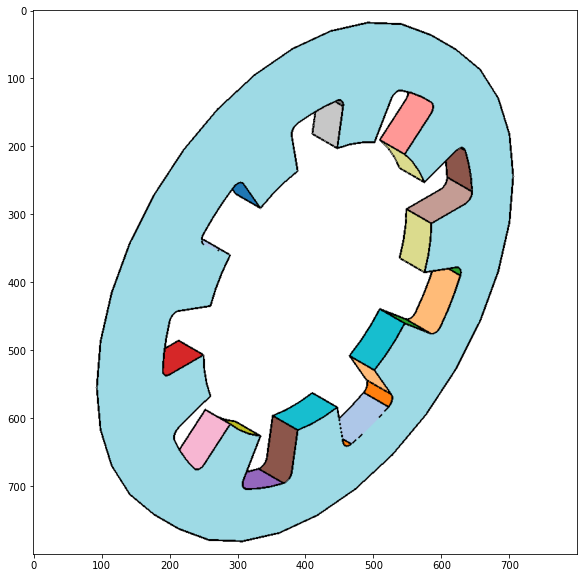

In [53]:
part = Part(data.open(parts_list[665]).read().decode('utf-8'))
pose, zoom = find_best_angle(part)
image = render_part(part, pose, zoom)
plt.figure(figsize=(10,10))
plt.imshow(image)

In [702]:
's2.0.0/breps/step/83393_7fbd8006_0.stp'
parts_list[2711]


's2.0.0/breps/step/83393_7fbd8006_0.stp'

In [700]:
part.mesh.F.shape

(212, 3)

In [54]:
plt.figure(figsize=(10,10))
plt.imshow(np.stack([edge_mask]*3,axis=-1)*color)

NameError: name 'edge_mask' is not defined

<Figure size 720x720 with 0 Axes>

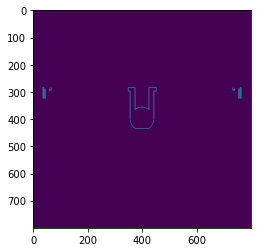

In [303]:
plt.imshow(((color[:,:,0].flatten() > 24) & (color[:,:,0].flatten() < 255)).astype(int).reshape(800,800))

In [257]:
np.unique(face_labels[:,0])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23])

In [245]:
len(np.unique(color[:,:,0].flatten()))

11

In [160]:
(cmap.colors[:,:3] * 255).astype(int)

array([[ 31, 119, 180],
       [174, 199, 232],
       [255, 127,  14],
       [255, 187, 120],
       [152, 223, 138],
       [214,  39,  40],
       [255, 152, 150],
       [148, 103, 189],
       [140,  86,  75],
       [196, 156, 148],
       [227, 119, 194],
       [247, 182, 210],
       [199, 199, 199],
       [188, 189,  34],
       [219, 219, 141],
       [ 23, 190, 207],
       [158, 218, 229]])

In [223]:
def tb_edge_mesh(edge_samples, color=(1.0, .8, .1), r = 0.001, M=3):
    edge_samples = edge_samples.detach()
    starts = edge_samples[:,:-1,:].reshape(-1,3)
    ends = edge_samples[:,1:,:].reshape(-1,3)
    N = starts.shape[0]
    dirs = ends - starts
    dirs = dirs / torch.linalg.norm(dirs,dim=1).reshape((-1,1))
    x = torch.cross(dirs, torch.rand_like(dirs))
    x = x / torch.linalg.norm(x,dim=1).reshape((-1,1))
    y = torch.cross(dirs, x)
    t = torch.arange(0,2*np.pi, 2*np.pi/M)
    M = len(t)
    sint = torch.sin(t)
    cost = torch.cos(t)
    circs = r * (torch.outer(cost, x.flatten()) + torch.outer(sint, y.flatten())).reshape(M,-1,3)
    start_circs = (starts + circs).reshape(-1,3)
    end_circs = (ends + circs).reshape(-1,3)
    edge_verts = torch.cat([start_circs, end_circs],dim=0)
    bottom_tris = torch.tensor([[m*N+n, ((m+1)%M)*N+n, ((m+1)%M)*N+n+N*M] for n in range(N) for m in range(M)])
    top_tris = torch.tensor([[m*N+n, ((m+1)%M)*N+n+M*N, m*N+n+M*N] for n in range(N) for m in range(M)])
    edge_faces = torch.cat([bottom_tris,top_tris],dim=0)

    edge_verts = edge_verts
    edge_faces = edge_faces
    edge_colors = (torch.tensor(color).tile((edge_verts.shape[0], 1)) * 255).byte()
    return edge_verts, edge_faces, edge_colors

def edge_mesh(part):
    e2t = part.mesh_topology.edge_to_topology
    E = np.concatenate([
        part.mesh.F[e2t[:,0] >= 0][:,[2,0]],
        part.mesh.F[e2t[:,1] >= 0][:,[0,1]],
        part.mesh.F[e2t[:,2] >= 0][:,[1,2]]
    ],axis=0)
    V, F, C = tb_edge_mesh(torch.tensor(part.mesh.V[E]), color=(0.,0.,0.), r = 0.1, M=10)
    mesh = trimesh.Trimesh(vertices=V, faces=F, face_colors=C)
    return pyrender.Mesh.from_trimesh(mesh, smooth=False)


In [224]:
edge_mesh(part)

In [55]:
from train_latent_space import BRepDS, BRepFaceAutoencoder, BRepFaceEncoder

model = BRepFaceAutoencoder(64,1024,4)
ckpt = torch.load('/projects/grail/benjonesnb/cadlab/siggasia2022/precoded/BRepFaceAutoencoder_64_1024_4.ckpt')
model.load_state_dict(ckpt['state_dict'])



<All keys matched successfully>

In [56]:
codes = torch.load('/projects/grail/benjonesnb/cadlab/siggasia2022/precoded/fusion360seg_coded.pt')

In [60]:
face_codes = codes[parts_list[2711]]['x']

In [58]:
def predict(face_codes, model, N=100):
    n_faces = face_codes.shape[0]
    line = torch.linspace(-0.1,1.1,N)
    grid = torch.cartesian_prod(line, line)
    grids = grid.repeat(n_faces,1)
    indices = torch.arange(n_faces).repeat_interleave(N*N, dim=0)
    with torch.no_grad():
        indexed_codes = face_codes[indices]
        uv_codes = torch.cat([grids, indexed_codes],dim=1)
        preds = model.decoder(uv_codes)
    return preds

In [61]:
preds = predict(face_codes, model, N=100)

/homes/grail/benjones/anaconda3/envs/automate/lib/python3.8/site-packages/torch/functional.py:1069: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1634272128894/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.cartesian_prod(tensors)  # type: ignore[attr-defined]


In [62]:
from render_shape import preds_to_mesh

In [63]:
V, F, C = preds_to_mesh(preds, 100)

In [64]:
testing_losses = torch.load('f360_render_test_losses.pt')

In [65]:
avg_losses = np.array([x[0].item() for x in testing_losses])
part_sizes = np.array([x[1] for x in testing_losses])
total_losses = avg_losses * part_sizes
avg_sorted = sorted(enumerate(zip(avg_losses, part_sizes, total_losses)),key=lambda x: x[1][0])
total_sorted = sorted(enumerate(zip(avg_losses, part_sizes, total_losses)),key=lambda x: x[1][2])
total_filtered = [x for x in total_sorted if x[1][1] > 20]

In [66]:
k = 0
gts = []
renders = []
for k in tqdm(range(100)):
    i = total_filtered[k][0]
    N = 100
    preds = predict(codes[parts_list[i]]['x'], model, N)
    V, F, C = preds_to_mesh(preds, N)
    part = Part(data.open(parts_list[i]).read().decode('utf-8'))
    pose, zoom = find_best_angle(part)
    ground_truth = render_part(part, pose, zoom)
    rendering = render_mesh(V,F,C,pose,zoom)
    gts.append(ground_truth)
    renders.append(rendering)


  0%|          | 0/100 [00:00<?, ?it/s]

In [68]:
rows = 6
cols = 4
M = rows*cols
s = 5
fig, axes = plt.subplots(int(M/cols), cols*2, figsize=(2*cols*s, s*int(M/cols)),gridspec_kw = {'wspace':0, 'hspace':0}, dpi=300)
for i in range(M):
    row = int(i / cols)
    col = i % cols
    axes[row,2*col].imshow(gts[i])
    axes[row,2*col].axis('off')
    axes[row,2*col+1].imshow(renders[i])
    axes[row,2*col+1].axis('off')

In [755]:
render_results = {'gts':gts,'renders':renders}
torch.save(render_results, 'render_results.pt')

In [759]:
axes.shape

(100, 2)

In [772]:
rows = 8
cols = 3
M = rows*cols
s = 5
fig, axes = plt.subplots(int(M/cols), cols*2, figsize=(2*cols*s, s*int(M/cols)),gridspec_kw = {'wspace':0, 'hspace':0}, dpi=300)
for i in range(M):
    row = int(i / cols)
    col = i % cols
    axes[row,2*col].imshow(gts[i])
    axes[row,2*col].axis('off')
    axes[row,2*col+1].imshow(renders[i])
    axes[row,2*col+1].axis('off')
fig.savefig('renderings.png')

In [767]:
fig.savefig('renderings.png')

In [769]:
from matplotlib import gridspec

In [740]:
im2 = render_mesh(V,F,C,pose,zoom)

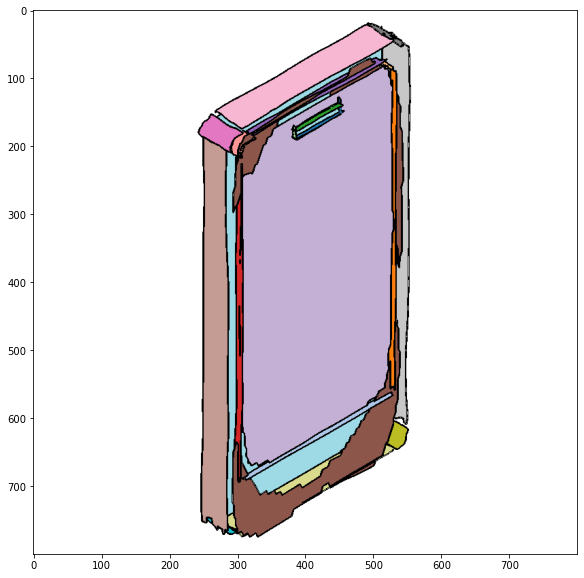

In [741]:
plt.figure(figsize=(10,10))
plt.imshow(im2)

In [1]:
import mitsuba as mi

In [12]:
mi.set_variant('scalar_rgb')

In [31]:
img = mi.render(mi.load_dict(mi.cornell_box()), spp=512)

In [32]:
from matplotlib import pyplot as plt

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


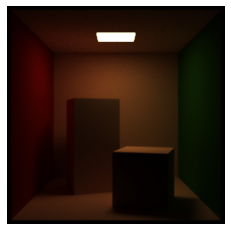

In [33]:
plt.axis("off")
plt.imshow(img)